---
# Exercise

1 - create the geodataframe of the [libraries](https://opendata.anagrafe.iccu.sbn.it/territorio.zip) of Italy (data from the italian [Ministry of Culture](https://anagrafe.iccu.sbn.it/it/open-data/)) and count the total of the libraries for each muncipality of Trentino

2 - identify the difference of municipalities in Trentino in the year [2016](https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2016.parquet) with the year [2025](https://github.com/napo/geospatial_unitn_2025/raw/refs/heads/main/data/municipalities_trentino_2025.parquet)
  - identify which municipalities are created from aggregation to others
  - find the new municipality with the largest extension in Trentino and show all the italian municipalities with bordering it
  - create the macroarea of all the municipalities bordering with it
  - for each library in the macro-area, calculate how many charging stations have been within a 500m radius
  
3 - create a polygon that contains all the charging stations inside the area
  - identify all the libraries in this area which are within 2km of each other
  - save the polygon in geopackage with the attribute "description" with the name of the library

4 - create the polygon of the Island of Elba from the layer of municipalities with functions of overlay

# Solutions

## learning objectives
* repeat the concepts on the previous lesson
* spatial sql
* errors with the simplified boundaries
* convex hull / concave hull / alphashape
* nearest_points


## Setup

In [6]:
pip install -r https://napo.github.io/geospatialcourse2025/requirements.txt --break-system-packages

---

### Import of the packages

In [7]:
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import warnings
warnings.simplefilter("ignore")
pd.options.mode.chained_assignment = None

# 1 - create the geodataframe of the [libraries](https://opendata.anagrafe.iccu.sbn.it/territorio.zip) of Italy

In [8]:
urlfile = "https://opendata.anagrafe.iccu.sbn.it/territorio.zip"

In [15]:
libraries = pd.read_csv(urlfile, sep=";")

In [16]:
libraries.head(5)

,codice-isil,codice-sbn,denominazione,indirizzo,frazione,cap,comune,codice istat comune,provincia,regione,codice istat provincia,latitudine,longitudine,telefono,fax,email,url
0,IT-AG0001,AGR27,Biblioteca della Soprintendenza per i beni cul...,Contrada S. Nicola,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,"37,3361677","13,5880717",+39 0922595830,NaN,NaN,NaN
1,IT-AG0005,NaN,Biblioteca dell'Archivio di Stato di Agrigento,via Mazzini 185,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,"37,3221644312329","13,5886026454773",+39 0922602494,+39 0922613242,as-ag@cultura.gov.it,http://www.archiviodistatoagrigento.benicultur...
2,IT-AG0006,PBED8,Biblioteca del Seminario vescovile,Piazza don Minzoni,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,"37,3137125","13,5749656",+39 3478809439,+39 0922.490024,bibliotecadiocesana@diocesiag.it,NaN
3,IT-AG0007,AGR01,Biblioteca Comunale Franco La Rocca,Piazzale Aldo Moro 3,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,"37,3095818","13,586151",+39 0922595166,+39 0922401246,biblioteca.larocca@comune.agrigento.it,http://www.opacagrigento.it/biblioteche/bi_1.html
4,IT-AG0008,NaN,Biblioteca comunale F. La Rocca - Sezione este...,Via Belvedere 127,Giardina Gallotti,92100,Agrigento,84001,Agrigento,SICILIA,84,"37,4050904","13,5291051",+39 0922410117,NaN,NaN,NaN


In [17]:
libraries.columns

Index(['codice-isil', 'codice-sbn', 'denominazione', 'indirizzo', 'frazione',
       'cap', 'comune', 'codice istat comune', 'provincia', 'regione',
       'codice istat provincia', 'latitudine', 'longitudine', 'telefono',
       'fax', 'email', 'url'],
      dtype='object')

In [18]:
columns = {
    'codice-isil': 'isil',
    'codice-sbn': 'sbn',
    'denominazione': 'name',
    'indirizzo':'address',
    'frazione':'village',
    'cap':'zipcode',
    'comune':'city',
    'codice istat comune': 'istat_city',
    'provincia':'province',
    'regione': 'region',
    'codice istat provincia': 'istat_province',
    'latitudine':'latitude',
    'longitudine':'longitude',
    'telefono':'phone'
}

In [19]:
libraries.rename(columns=columns,inplace=True)

In [23]:
libraries.head(3)

,isil,sbn,name,address,village,zipcode,city,istat_city,province,region,istat_province,latitude,longitude,phone,fax,email,url
0,IT-AG0001,AGR27,Biblioteca della Soprintendenza per i beni cul...,Contrada S. Nicola,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,37.336168,13.588072,+39 0922595830,NaN,NaN,NaN
1,IT-AG0005,NaN,Biblioteca dell'Archivio di Stato di Agrigento,via Mazzini 185,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,37.322164,13.588603,+39 0922602494,+39 0922613242,as-ag@cultura.gov.it,http://www.archiviodistatoagrigento.benicultur...
2,IT-AG0006,PBED8,Biblioteca del Seminario vescovile,Piazza don Minzoni,NaN,92100,Agrigento,84001,Agrigento,SICILIA,84,37.313713,13.574966,+39 3478809439,+39 0922.490024,bibliotecadiocesana@diocesiag.it,NaN


In [ ]:
libraries['latitude'] = libraries['latitude'].str.replace(",",".").astype(float)
libraries['longitude'] = libraries['longitude'].str.replace(",",".").astype(float)

## create the geodataframe

In [25]:
geo_libraries = gpd.GeoDataFrame(
    libraries,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(libraries.longitude, libraries.latitude))

check if all the coordinates are presents

In [26]:
geo_libraries.latitude.isnull().sum()

np.int64(10)

In [27]:
geo_libraries.longitude.isnull().sum()

np.int64(10)

In [28]:
libraries = libraries[~libraries.latitude.isnull()]

In [29]:
geo_libraries = gpd.GeoDataFrame(
    libraries,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(libraries.longitude, libraries.latitude))

In [30]:
geo_libraries[geo_libraries.geometry.is_empty].shape[0]

0

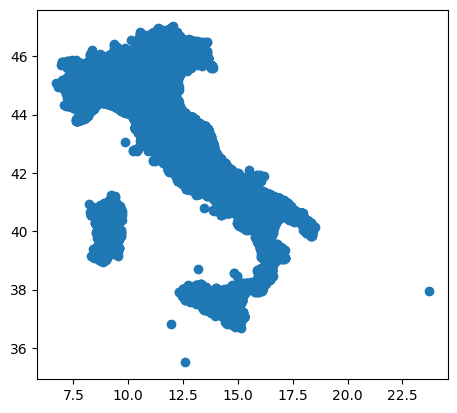

In [31]:
geo_libraries.plot()
plt.show()

## count the total of the libraries for each muncipality of Trentino

we need the data of the municipalities of Trentino

here is provided as parquet format

https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2025.parquet

### load the data

In [32]:
url2025 = 'https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2025.parquet'
municipalities2025 = pd.read_parquet(url2025)

In [33]:
municipalities2025.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
2759,2,4,22,0,22,22001,022001,Ala,None,0,71779.056634,1.198549e+08,b'\x01\x03\x00\x00\x00\x01\x00\x00\x001\x08\x0...
2760,2,4,22,0,22,22002,022002,Albiano,None,0,13182.956388,9.937271e+06,b'\x01\x03\x00\x00\x00\x01\x00\x00\x00c\x01\x0...
2761,2,4,22,0,22,22003,022003,Aldeno,None,0,15568.292906,8.974948e+06,b'\x01\x03\x00\x00\x00\x01\x00\x00\x00\xb3\x01...


In [34]:
municipalities2025.geometry[2759]

b'\x01\x03\x00\x00\x00\x01\x00\x00\x001\x08\x00\x00\x7f^{\xed\x96\x02&@[\xe5Z\x9eW\xe9F@\x16\xd8\xa0r&\x03&@}v=\t8\xe9F@\xc1\xa0\xbc\xb0G\x03&@[\x95>\x987\xe9F@[\xcfY\xaeX\x03&@\xbf\x81E\xa32\xe9F@\xd7\xf9\x7f\xd7o\x03&@H2^},\xe9F@\xaa"\xad\\\x89\x03&@WeF\xa0&\xe9F@$\xcc\xbeO\xa1\x03&@\x15\x91\x16\xef\x1f\xe9F@\xf7\xc7V2\xbb\x03&@-\x93\xd8\xad\x19\xe9F@v8\x07e\xc8\x03&@\xa1N;}\x16\xe9F@\xf4Bv\xf8\xd0\x03&@\xfcX\xa1j\x14\xe9F@\x8b\x03\xb2C\xef\x03&@\x80\xc9\xe9\xa4\x19\xe9F@\x84\xc6i\x14\xfa\x03&@\xb9\xed`\x83\x1b\xe9F@\xae\xdc\x92\xa3\x00\x04&@\xfd\xb8\xd1c\x1c\xe9F@Je8\xe3\t\x04&@\xed\x15\xdf\xa1\x1d\xe9F@K\xeeg[\x18\x04&@9\xd5\x0f\x8e\x1e\xe9F@\xef\xa25\xca\x1d\x04&@h\xe4Z\xe5\x1e\xe9F@!\x9f =6\x04&@\x1c\x048P\x1d\xe9F@\x91\xe3$\xadW\x04&@\x95-\xb1\xb8\x1c\xe9F@\xb2E.ko\x04&@\xb03\xf4\xce\x1b\xe9F@z2Q~~\x04&@\xa1C\x05:\x1b\xe9F@k\xd5-\xa2\xae\x04&@\x97[\xab\xa7\x18\xe9F@\x84\xb7\xa7\x9d\xdf\x04&@\x85\x95\x88\x14\x16\xe9F@\xb8\xc1\x00\x8b\r\x05&@\xd7\xd9\x05\xc8\x12\xe9F@&\xe5\xf8\x85

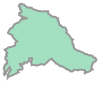

In [35]:
from shapely import from_wkb
from_wkb(municipalities2025.geometry[2759])

In [36]:
from_wkb(municipalities2025.geometry[2759]).wkt

'POLYGON ((11.00505773669215 45.822986406691335, 11.006152708181656 45.82202258587947, 11.006406329179642 45.82200911575156, 11.006535957778103 45.82185784238708, 11.006712660190642 45.821670218462316, 11.006907364020055 45.821491274235704, 11.007090084114743 45.82128704645053, 11.007287571996114 45.82109616351077, 11.007388264781394 45.820998815496985, 11.007453693805907 45.82093556288052, 11.007684817772107 45.82109509864222, 11.007767331993144 45.821152136162205, 11.00781737487554 45.821178891566866, 11.007887936243282 45.82121680634359, 11.007998329579229 45.821244962435635, 11.008039778754634 45.82125536859604, 11.008226309044007 45.821207072593296, 11.008481417420429 45.82118900920174, 11.008662557028263 45.821161145438396, 11.008777568256154 45.82114339119949, 11.009144847960405 45.821064909621036, 11.009518553469896 45.82098633450645, 11.009868949739811 45.820885660988715, 11.010090052254395 45.820814266919015, 11.010443674261591 45.820758549562846, 11.010603027807107 45.820747

In [37]:
geo_municipalities2025 = gpd.GeoDataFrame(
    municipalities2025,
    crs="epsg:4326",
    geometry=municipalities2025['geometry'].apply(lambda x:from_wkb(x))
)

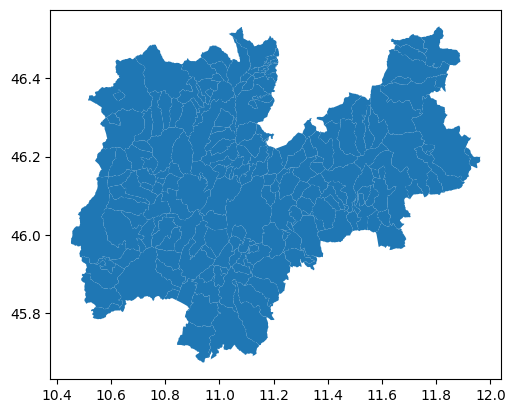

In [38]:
geo_municipalities2025.plot()
plt.show()

In [39]:
import urllib
urllib.request.urlretrieve(url2025 ,"municipalities_trentino_2025.parquet")

('municipalities_trentino_2025.parquet',
 <http.client.HTTPMessage at 0x78e7bf27bb00>)

In [40]:
geo_municipalities2025 = gpd.read_parquet("municipalities_trentino_2025.parquet")

In [41]:
geo_municipalities2025.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

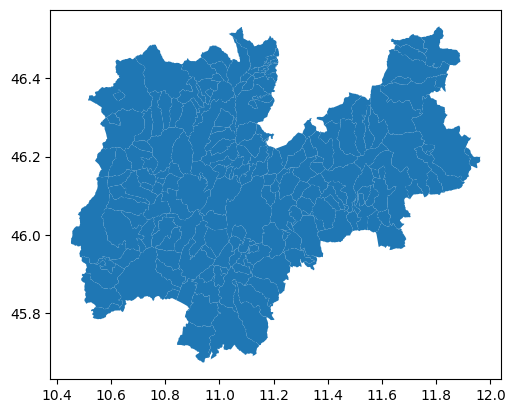

In [42]:
geo_municipalities2025.plot()
plt.show()

### count the points

In [43]:
libraries_municipalities_trentino = geo_libraries.sjoin(geo_municipalities2025,predicate="within")

[]

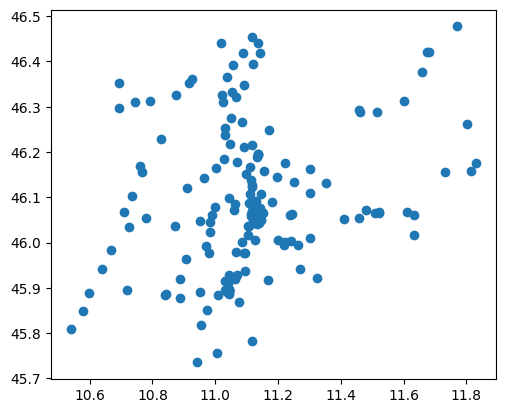

In [44]:
libraries_municipalities_trentino.plot()
plt.plot()

In [45]:
libraries_municipalities_trentino.region.unique()

array(['TRENTINO-ALTO ADIGE/SÜDTIROL'], dtype=object)

In [46]:
libraries_municipalities_trentino.province.unique()

array(['Trento'], dtype=object)

In [47]:
libraries_municipalities_trentino.COMUNE.value_counts()

,count
COMUNE,
Trento,57
Rovereto,13
San Michele all'Adige,4
Altopiano della Vigolana,3
Madruzzo,3
...,...
Tre Ville,1
Spiazzo,1
Carisolo,1


# 2 - identify the difference of municipalities in Trentino in the year [2016](https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2016.parquet) with the year [2025](https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2025.parquet)


there is the way of geopandas for the geoparquet format

In [ ]:
url2016 = 'https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/municipalities_trentino_2016.parquet'
municipalities2016 = pd.read_parquet(url2016)

... or ... you can simple download the file and open it with the method .read_parquet() for the GeoDataFrame

In [ ]:
# download the file
geo_municipalities2016_file = "municipalities_trentino_2016.parquet"
urllib.request.urlretrieve(url2016 ,geo_municipalities2016_file)

In [ ]:
geo_municipalities2016 = gpd.read_parquet(geo_municipalities2016_file)

In [68]:
geo_municipalities2016.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_PCM,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_P_CM,Shape_Leng,Shape_Area,geometry
0,2,4,22,0,22,22030,022030,Cagnò,None,0,16888.757471,3.407854e+06,"MULTIPOLYGON (((11.04657 46.43613, 11.04639 46..."
1,2,4,22,0,22,22123,022123,Mori,None,0,44651.383930,3.448341e+07,"POLYGON ((10.99097 45.82502, 10.9909 45.82569,..."
2,2,4,22,0,22,22002,022002,Albiano,None,0,13195.361691,9.964248e+06,"POLYGON ((11.20754 46.1562, 11.20791 46.15606,..."


In [69]:
geo_municipalities2016.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

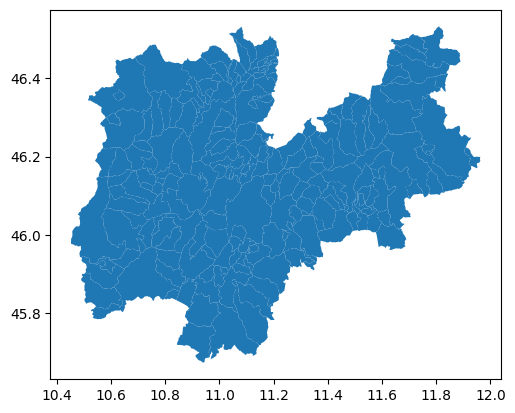

In [70]:
geo_municipalities2016.plot()
plt.show()

and now we are ready to solve the issue

In [71]:
geo_municipalities2016.shape[0]-geo_municipalities2025.shape[0]

12

obtain the list of all the old municipalities (not present in 2025)

In [72]:
ids_municipalities2016 = set(list(geo_municipalities2016.PRO_COM_T.unique()))-set(list(geo_municipalities2025.PRO_COM_T.unique()))

In [73]:
ids_municipalities2016

{'022027',
 '022030',
 '022041',
 '022046',
 '022063',
 '022070',
 '022080',
 '022088',
 '022099',
 '022111',
 '022126',
 '022145',
 '022152',
 '022154',
 '022211',
 '022217',
 '022225'}

obtain the list of all the new municipalities (not present in 2016)

In [74]:
ids_municipalities2025 = set(list(geo_municipalities2025.PRO_COM_T.unique()))-set(list(geo_municipalities2016.PRO_COM_T.unique()))

In [75]:
ids_municipalities2025

{'022250', '022251', '022252', '022253', '022254'}

create the geodataframe of the new municipalities in 2025

In [76]:
new_municipalities2025 = geo_municipalities2025[geo_municipalities2025.PRO_COM_T.isin(ids_municipalities2025)]

In [77]:
old_municipalities2016 = geo_municipalities2016[geo_municipalities2016.PRO_COM_T.isin(ids_municipalities2016)]

In [78]:
old_municipalities2016

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_PCM,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_P_CM,Shape_Leng,Shape_Area,geometry
0,2,4,22,0,22,22030,022030,Cagnò,None,0,16888.757471,3.407854e+06,"MULTIPOLYGON (((11.04657 46.43613, 11.04639 46..."
13,2,4,22,0,22,22027,022027,Brez,None,0,26280.400972,1.916712e+07,"POLYGON ((11.0623 46.49919, 11.06238 46.49912,..."
19,2,4,22,0,22,22041,022041,Carano,None,0,22704.527526,1.357006e+07,"POLYGON ((11.40949 46.32452, 11.41012 46.32446..."
33,2,4,22,0,22,22046,022046,Castelfondo,None,0,31016.516905,2.587157e+07,"POLYGON ((11.08636 46.51548, 11.08638 46.51536..."
46,2,4,22,0,22,22126,022126,Nave San Rocco,None,0,9669.557242,4.891540e+06,"POLYGON ((11.113 46.18226, 11.11326 46.18158, ..."
52,2,4,22,0,22,22145,022145,Pozza di Fassa,None,0,56755.058437,7.297219e+07,"POLYGON ((11.64313 46.47494, 11.64361 46.47439..."
56,2,4,22,0,22,22063,022063,Cloz,None,0,13642.632640,8.211168e+06,"POLYGON ((11.07267 46.44152, 11.07282 46.44149..."
61,2,4,22,0,22,22154,022154,Romallo,None,0,7687.630873,2.444897e+06,"POLYGON ((11.071 46.40712, 11.07114 46.40709, ..."
68,2,4,22,0,22,22217,022217,Vigo di Fassa,None,0,29287.593090,2.685008e+07,"POLYGON ((11.67311 46.43072, 11.67272 46.43047..."
81,2,4,22,0,22,22211,022211,Varena,None,0,25565.229642,2.306859e+07,"POLYGON ((11.4926 46.36134, 11.49344 46.36129,..."


In [79]:
old_municipalities2016.explore()

create the geodataframe of all the old municipalities 2016

In [80]:
new_municipalities2025

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
2920,2,4,22,0,22,22250,022250,San Giovanni di Fassa-Sèn Jan,Sèn Jan,0,65378.351607,9.982223e+07,"POLYGON ((11.64313 46.47494, 11.64361 46.47439..."
2921,2,4,22,0,22,22251,022251,Terre d'Adige,None,0,34685.938218,1.657723e+07,"MULTIPOLYGON (((11.05003 46.1754, 11.05031 46...."
2922,2,4,22,0,22,22252,022252,Borgo d'Anaunia,None,0,64921.168526,6.322876e+07,"MULTIPOLYGON (((11.21582 46.44893, 11.21596 46..."
2923,2,4,22,0,22,22253,022253,Novella,None,0,44596.139021,4.658865e+07,"POLYGON ((11.0623 46.49919, 11.06238 46.49912,..."
2924,2,4,22,0,22,22254,022254,Ville di Fiemme,None,0,42006.726203,4.614938e+07,"POLYGON ((11.49344 46.36129, 11.49401 46.36128..."


[]

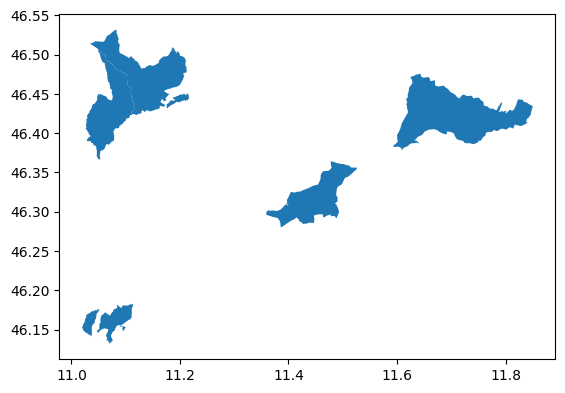

In [81]:
new_municipalities2025.plot()
plt.plot()

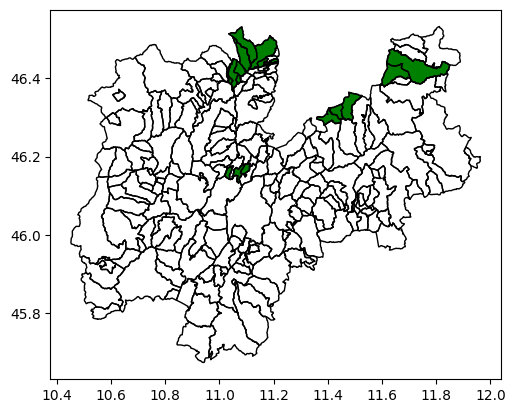

In [82]:
ax = new_municipalities2025.to_crs(epsg=4326).plot(edgecolor='k', facecolor='green')
geo_municipalities2016.plot(ax=ax,facecolor='none')
plt.show()

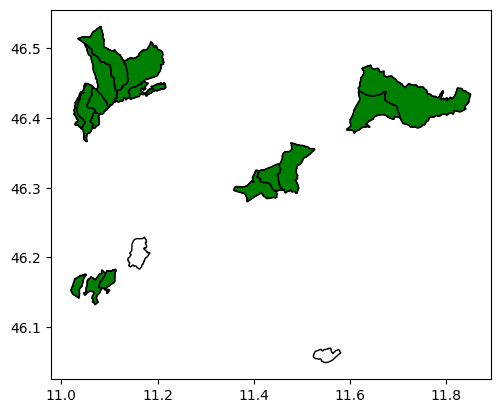

In [83]:
ax = new_municipalities2025.to_crs(epsg=4326).plot(edgecolor='k', facecolor='green')
old_municipalities2016.plot(ax=ax,facecolor='none')
plt.show()

In [94]:
def whereincluded(geometry, geometries_gdf):
    name = "not included"
    found = geometries_gdf[geometries_gdf.contains(geometry.representative_point())]
    if len(found) > 0:
        name = found.COMUNE.values[0]
    return(name)

In [95]:
new_municipalities2025.geometry.apply(lambda g: whereincluded(g,geo_municipalities2016))

,geometry
2920,Pozza di Fassa
2921,Zambana
2922,Fondo
2923,Cloz
2924,Daiano


the spatial relationship way

In [96]:
geo_municipalities2016['included_in'] = geo_municipalities2016.geometry.apply(lambda g: whereincluded(g,new_municipalities2025))

In [97]:
geo_municipalities2016.included_in.unique()

array(['Novella', 'not included', 'Ville di Fiemme', "Borgo d'Anaunia",
       "Terre d'Adige", 'San Giovanni di Fassa-Sèn Jan'], dtype=object)

In [98]:
municipalities_merged = geo_municipalities2016[geo_municipalities2016['included_in'] != "not included"]

In [99]:
municipalities_merged[['COMUNE','included_in']]

,COMUNE,included_in
0,Cagnò,Novella
13,Brez,Novella
19,Carano,Ville di Fiemme
33,Castelfondo,Borgo d'Anaunia
46,Nave San Rocco,Terre d'Adige
52,Pozza di Fassa,San Giovanni di Fassa-Sèn Jan
56,Cloz,Novella
61,Romallo,Novella
68,Vigo di Fassa,San Giovanni di Fassa-Sèn Jan
81,Varena,Ville di Fiemme


### find the biggest new municipality of Trentino and show all the italian municipalities with bordering it

In [100]:
biggest_municipality = new_municipalities2025[new_municipalities2025.geometry.area == new_municipalities2025.geometry.area.max()]

In [101]:
biggest_municipality.COMUNE

,COMUNE
2920,San Giovanni di Fassa-Sèn Jan


In [102]:
boundary = biggest_municipality.geometry.values[0]

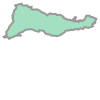

In [103]:
boundary

In [104]:
around = geo_municipalities2025[geo_municipalities2025.touches(boundary)]

In [105]:
around

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
2783,2,4,22,0,22,22039,022039,Canazei,None,0,49656.063655,6.701750e+07,"POLYGON ((11.8243 46.52276, 11.8245 46.5226, 1..."
2827,2,4,22,0,22,22113,022113,Mazzin,None,0,28156.255670,2.362813e+07,"POLYGON ((11.6496 46.48748, 11.65097 46.48713,..."
2832,2,4,22,0,22,22118,022118,Moena,None,0,62203.673474,8.259439e+07,"POLYGON ((11.79491 46.40553, 11.79501 46.40528..."
2871,2,4,22,0,22,22176,022176,Soraga di Fassa,None,0,32038.542390,1.974463e+07,"MULTIPOLYGON (((11.67001 46.40482, 11.67049 46..."


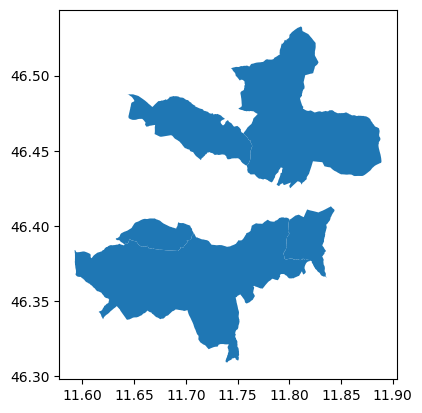

In [106]:
around.plot()
plt.show()

### create the macroarea of all the municipalities bordering with it

In [107]:
new_area = pd.concat([around,biggest_municipality], ignore_index=True).dissolve()


In [108]:
new_area

,geometry,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area
0,"POLYGON ((11.84036 46.41294, 11.84041 46.41291...",2,4,22,0,22,22039,022039,Canazei,Sèn Jan,0,49656.063655,6.701750e+07


In [109]:
new_area['name'] = "macroarea"

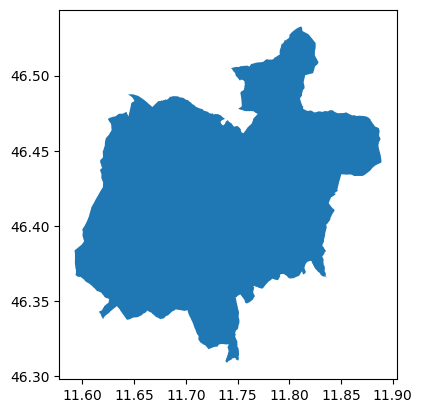

In [110]:
new_area.plot()
plt.show()

### for each library in the macro-area, calculate how many charging stations have been within a 500m radius

You can find the dataset [here](https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/italian_charging_stations.geojson)




In [111]:
charging_stations = gpd.read_file("https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/italian_charging_stations.geojson")

In [112]:
cod_prov = new_area.COD_PROV.unique()[0]

In [113]:
cod_prov

np.int64(22)

In [114]:
area_province_trento = geo_municipalities2025[geo_municipalities2025.COD_PROV == cod_prov].dissolve().to_crs(4326).geometry[0]

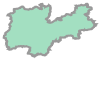

In [115]:
area_province_trento

In [116]:
charging_stations_in_area = charging_stations[charging_stations.geometry.within(area_province_trento)]

In [117]:
charging_stations_in_area.province.unique()

array(['Trento'], dtype=object)

In [118]:
charging_stations500m = charging_stations_in_area.to_crs(epsg=32632).buffer(50000).to_crs(epsg=4326)

In [119]:
libraries_500m_from_charging_stations = geo_libraries[geo_libraries.within(charging_stations500m)].shape[0]

In [120]:
print("There are %s charging_stations 500m from the libraries " % libraries_500m_from_charging_stations)

There are 1 charging_stations 500m from the libraries 


## 3 - create a polygon that contains all the charging stations inside the province of the selected area


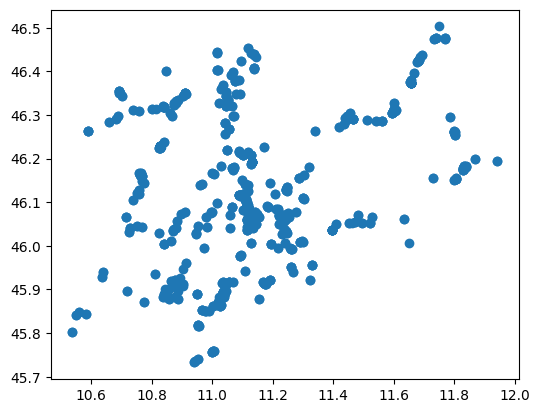

In [121]:
charging_stations_in_area.plot()
plt.show()

In [122]:
charging_stations_in_area.shape[0]

978

In [123]:
charging_stations_in_area_nospatialrel = charging_stations[charging_stations.province == "Trento"]

In [125]:
charging_stations_in_area_nospatialrel.shape[0]

978

the total is right ;)

### identify all the libraries in this area which are within 2km of each other

# 3 - creates a polygon that contains all the charging stations inside the area

## convex hull
solution: create a convex hull<br/>
*In geometry, the convex hull or convex envelope or convex closure of a shape is the smallest convex set that contains it. The convex hull may be defined either as the intersection of all convex sets containing a given subset of a Euclidean space, or equivalently as the set of all convex combinations of points in the subset. For a bounded subset of the plane, the convex hull may be visualized as the shape enclosed by a rubber band stretched around the subset.* (source: [wikipedia](https://en.wikipedia.org/wiki/Convex_hull))

![](https://upload.wikimedia.org/wikipedia/commons/thumb/d/de/ConvexHull.svg/301px-ConvexHull.svg.png)

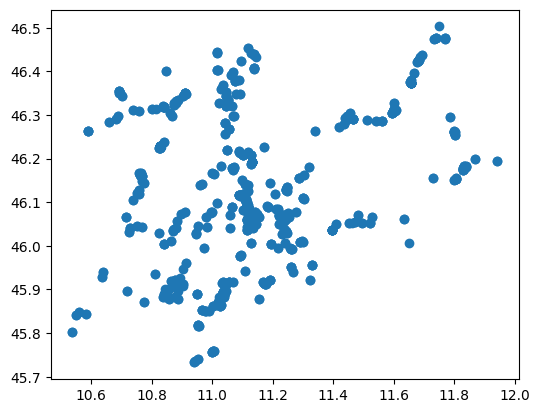

In [126]:
charging_stations_in_area.plot()
plt.show()

In [127]:
charging_stations_in_area_polygon = charging_stations_in_area.unary_union.convex_hull

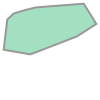

In [128]:
charging_stations_in_area_polygon

## Concave Hull

Contrary to a convex hull, a concave hull can describe the shape of a point cloud.

Convex hull<br/>
![](https://grass.osgeo.org/grass78/manuals/addons/v_concave_convex.png)
<br/><br/>
Concave hull<br/>
![](https://grass.osgeo.org/grass78/manuals/addons/v_concave_concave.png)


### Alpha shapes

Alpha shapes are often used to generalize bounding polygons containing sets of points. The alpha parameter is defined as the value a, such that an edge of a disk of radius 1/a can be drawn between any two edge members of a set of points and still contain all the points. The convex hull, a shape resembling what you would see if you wrapped a rubber band around pegs at all the data points, is an alpha shape where the alpha parameter is equal to zero

[https://alphashape.readthedocs.io/](https://alphashape.readthedocs.io/)

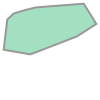

In [129]:
charging_stations_in_area_polygon

In [130]:
import alphashape

In [131]:
alpha_shape = alphashape.alphashape(charging_stations_in_area, 10)


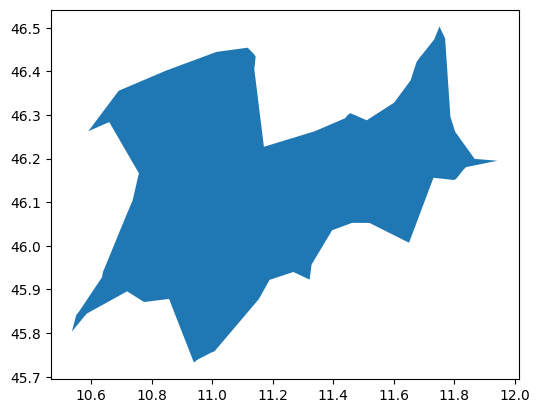

In [132]:
alpha_shape.plot()
plt.show()

In [133]:
convex_hull = gpd.GeoDataFrame(
    geometry=[charging_stations_in_area_polygon],
    columns=['geometry'],
    crs=charging_stations_in_area.crs)



In [134]:
convex_hull.explore()

In [135]:
charging_stations_in_area.explore()

In [136]:
alpha_paramenter = 10
alphashape.alphashape(charging_stations_in_area, alpha_paramenter).explore()

Creating alpha shapes around sets of points usually requires a visually interactive step where the alpha parameter for a concave hull is determined by iterating over or bisecting values to approach a best fit.

More informations: [https://alphashape.readthedocs.io/en/latest/readme.html#using-a-varying-alpha-parameter](https://alphashape.readthedocs.io/en/latest/readme.html#using-a-varying-alpha-parameter)

only for Trento city

In [138]:
trento_cs = charging_stations[charging_stations.municipality == "Trento"]
alphashape.alphashape(trento_cs, alpha_paramenter).explore()



## identify all the libraries in Trentino which are within 2km of each other

In [139]:
libraries_municipalities_trentino.shape[0]

194

## nearest points

In [140]:
from shapely.ops import nearest_points

shapely offers a method to identify the nearest points between two geometries<br/>
Documentation [here](https://shapely.readthedocs.io/en/stable/manual.html#shapely.ops.nearest_points)


In [141]:
libraries_municipalities_trentino['nearest_id'] = ""
libraries_municipalities_trentino['distance'] = -1
for idx, row in libraries_municipalities_trentino.to_crs(epsg=32632).iterrows():
    isil = row['isil']
    point = row['geometry']
    multipoints = libraries_municipalities_trentino[libraries_municipalities_trentino.isil != isil]["geometry"].to_crs(epsg=32632).unary_union
    nearest_geoms = nearest_points(point, multipoints)
    maxdistance = 0
    nearest_id = ""
    for pn in nearest_geoms:
        dist = point.distance(pn)
        if (dist > maxdistance and dist <= 2000):
            nearest_id = libraries_municipalities_trentino[libraries_municipalities_trentino.to_crs(epsg=32632).geometry == pn]['isil'].values[0]
            maxdistance = dist
    libraries_municipalities_trentino.loc[idx,"distance"] = maxdistance
    libraries_municipalities_trentino.loc[idx,"nearest_id"] = nearest_id
%time

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.68 µs


In [142]:
libraries_municipalities_trentino

,isil,sbn,name,address,village,zipcode,city,istat_city,province,region,...,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,nearest_id,distance
11567,IT-TN0001,NaN,Biblioteca comunale di Ala,Via Roma 40,NaN,38061,Ala,22001,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22001,022001,Ala,None,0,71779.056634,1.198549e+08,,0.000000
11568,IT-TN0005,NaN,Biblioteca Pubblica Comunale di Albiano,Via Pisetta 2,NaN,38041,Albiano,22002,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22002,022002,Albiano,None,0,13182.956388,9.937271e+06,,0.000000
11569,IT-TN0007,NaN,Biblioteca comunale di Aldeno,Via Giacometti 6,NaN,38060,Aldeno,22003,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22003,022003,Aldeno,None,0,15568.292906,8.974948e+06,IT-TN0181,336.949657
11570,IT-TN0008,NaN,Biblioteca civica B. Emmert di Arco,Via Segantini 9,NaN,38062,Arco,22006,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22006,022006,Arco,None,0,55264.794474,6.321755e+07,,0.000000
11571,IT-TN0012,NaN,Biblioteca comunale Arnaldo Segarizzi,Piazza Vittorio Emanuele III 2,NaN,38063,Avio,22007,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22007,022007,Avio,None,0,45289.300356,6.888839e+07,,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11756,IT-TN0600,NaN,Biblioteca Storica “Centro Studi per la Val di...,Piazza della Torraccia,NaN,38027,Terzolas,22195,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22195,022195,Terzolas,None,0,15879.876179,5.588751e+06,IT-TN0072,1186.334736
11757,IT-TN0601,NaN,"Biblioteca ""Mary Ward"" Arcivescovile - Dame In...",Corso Bettini 71,NaN,38068,Rovereto,22161,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22161,022161,Rovereto,None,0,49162.598935,5.098419e+07,IT-TN0103,220.435844
11758,IT-TN0602,NaN,Biblioteca Istituto Tecnico Tecnologico “G. Ma...,Via P. Monti 1,NaN,38068,Rovereto,22161,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22161,022161,Rovereto,None,0,49162.598935,5.098419e+07,IT-TN0165,910.946500
11759,IT-TN0603,NaN,Biblioteca della Soprintendenza per i beni e l...,"Via San Marco, 2",NaN,38122,Trento,22205,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22205,022205,Trento,None,1,76507.132055,1.578398e+08,IT-TN0179,96.203009


In [143]:
libraries_municipalities_trentino[['isil','name','city','nearest_id','distance']]

,isil,name,city,nearest_id,distance
11567,IT-TN0001,Biblioteca comunale di Ala,Ala,,0.000000
11568,IT-TN0005,Biblioteca Pubblica Comunale di Albiano,Albiano,,0.000000
11569,IT-TN0007,Biblioteca comunale di Aldeno,Aldeno,IT-TN0181,336.949657
11570,IT-TN0008,Biblioteca civica B. Emmert di Arco,Arco,,0.000000
11571,IT-TN0012,Biblioteca comunale Arnaldo Segarizzi,Avio,,0.000000
...,...,...,...,...,...
11756,IT-TN0600,Biblioteca Storica “Centro Studi per la Val di...,Terzolas,IT-TN0072,1186.334736
11757,IT-TN0601,"Biblioteca ""Mary Ward"" Arcivescovile - Dame In...",Rovereto,IT-TN0103,220.435844
11758,IT-TN0602,Biblioteca Istituto Tecnico Tecnologico “G. Ma...,Rovereto,IT-TN0165,910.946500
11759,IT-TN0603,Biblioteca della Soprintendenza per i beni e l...,Trento,IT-TN0179,96.203009


In [144]:
libraries_municipalities_trentino[libraries_municipalities_trentino['distance'] > 0]

,isil,sbn,name,address,village,zipcode,city,istat_city,province,region,...,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,nearest_id,distance
11569,IT-TN0007,NaN,Biblioteca comunale di Aldeno,Via Giacometti 6,NaN,38060,Aldeno,22003,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22003,022003,Aldeno,None,0,15568.292906,8.974948e+06,IT-TN0181,336.949657
11577,IT-TN0026,NaN,Punto di Lettura di Calceranica al Lago,Piazza Municipio 5/a,NaN,38050,Calceranica al Lago,22032,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22032,022032,Calceranica al Lago,None,0,9454.707772,3.394559e+06,IT-TN0223,1460.163551
11578,IT-TN0028,NaN,Biblioteca pubblica comunale di Caldonazzo - C...,Viale Stazione 2,NaN,38052,Caldonazzo,22034,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22034,022034,Caldonazzo,None,0,29221.345291,2.141298e+07,IT-TN0026,1944.661752
11582,IT-TN0035,NaN,Biblioteca Pubblica Comunale di Cavalese,Via Marconi 10,NaN,38033,Cavalese,22050,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22050,022050,Cavalese,None,0,33722.833358,4.537545e+07,IT-TN0039,406.584564
11583,IT-TN0039,NaN,Biblioteca Gian Pietro Muratori,via Muratori 1,NaN,38033,Cavalese,22050,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22050,022050,Cavalese,None,0,33722.833358,4.537545e+07,IT-TN0035,406.584564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11756,IT-TN0600,NaN,Biblioteca Storica “Centro Studi per la Val di...,Piazza della Torraccia,NaN,38027,Terzolas,22195,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22195,022195,Terzolas,None,0,15879.876179,5.588751e+06,IT-TN0072,1186.334736
11757,IT-TN0601,NaN,"Biblioteca ""Mary Ward"" Arcivescovile - Dame In...",Corso Bettini 71,NaN,38068,Rovereto,22161,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22161,022161,Rovereto,None,0,49162.598935,5.098419e+07,IT-TN0103,220.435844
11758,IT-TN0602,NaN,Biblioteca Istituto Tecnico Tecnologico “G. Ma...,Via P. Monti 1,NaN,38068,Rovereto,22161,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22161,022161,Rovereto,None,0,49162.598935,5.098419e+07,IT-TN0165,910.946500
11759,IT-TN0603,NaN,Biblioteca della Soprintendenza per i beni e l...,"Via San Marco, 2",NaN,38122,Trento,22205,Trento,TRENTINO-ALTO ADIGE/SÜDTIROL,...,22,22205,022205,Trento,None,1,76507.132055,1.578398e+08,IT-TN0179,96.203009


## 4 - create the polygon of the Island of Elba from the layer of municipalities with functions of overlay

- identify Elba Island
- generate an area around the island
- clip the geometry


open [umap](https://umap.openstreetmap.eu) and draw an area around [Elba](https://en.wikipedia.org/wiki/Elba) Island and download it in geojson format

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/refs/heads/master/images/isola_elba.gif)

the geojson file is available also [here](https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/elbaisland.geojson)

In [145]:
url_area = "https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/elbaisland.geojson"
area_around_elba = gpd.read_file(url_area)

In [146]:
url = 'https://github.com/napo/geospatialcourse2025/raw/refs/heads/main/data/istat_administrative_units_generalized_2025.gpkg'
macroregions25 = gpd.read_file(url,layer="macroregions")
municipalities25 = gpd.read_file(url,layer="municipalities")

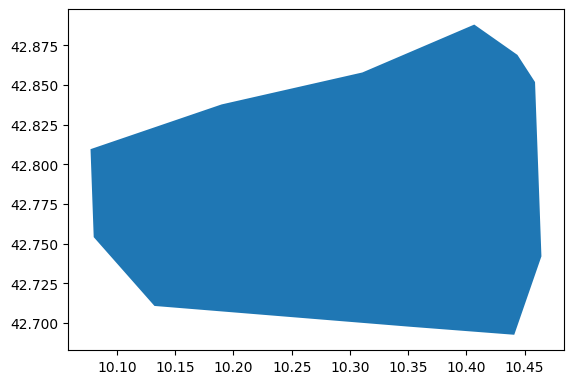

In [147]:
area_around_elba.plot()
plt.show()

In [148]:
gdf_clipped_area = gpd.clip(macroregions25.to_crs(epsg=4326), area_around_elba, keep_geom_type=False)


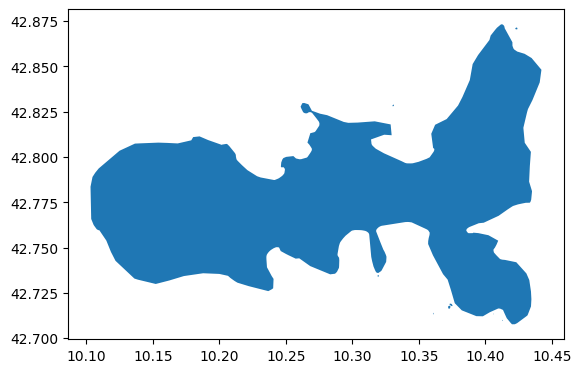

In [149]:
gdf_clipped_area.plot()
plt.show()

In [150]:
elba_island = gdf_clipped_area.dissolve()

In [151]:
elba_island

,geometry,COD_RIP,DEN_RIP
0,"MULTIPOLYGON (((10.36097 42.71333, 10.36101 42...",3,Centro


remove not usefull columns

In [152]:
del elba_island['COD_RIP']

In [153]:
del elba_island['DEN_RIP']

In [154]:
elba_island['name'] = "Elba"

In [155]:
elba_island

,geometry,name
0,"MULTIPOLYGON (((10.36097 42.71333, 10.36101 42...",Elba


if you want to know the names of the municipalities on the Island of Elba

In [156]:
municipalities_in_elba = municipalities25[municipalities25.to_crs(epsg=4326).geometry.intersects(elba_island.geometry.values[0]) == True]
%time

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.48 µs


In [157]:
municipalities_in_elba

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,geometry
4251,3,9,49,0,49,49003,049003,Campo nell'Elba,None,0,"MULTIPOLYGON (((590817.687 4715271.344, 590824..."
4252,3,9,49,0,49,49004,049004,Capoliveri,None,0,"MULTIPOLYGON (((615720.291 4729535.284, 615714..."
4258,3,9,49,0,49,49010,049010,Marciana,None,0,"MULTIPOLYGON (((593259.335 4740075.65, 594698...."
4259,3,9,49,0,49,49011,049011,Marciana Marina,None,0,"MULTIPOLYGON (((597420.051 4740336.897, 598210..."
4261,3,9,49,0,49,49013,049013,Porto Azzurro,None,0,"MULTIPOLYGON (((614452.931 4738632.93, 614594...."
4262,3,9,49,0,49,49014,049014,Portoferraio,None,0,"MULTIPOLYGON (((608179.407 4689583.409, 608284..."
4267,3,9,49,0,49,49021,049021,Rio,None,0,"MULTIPOLYGON (((626592.814 4746495.837, 626606..."


or

In [158]:
municipalities_in_elba = gpd.clip(municipalities25.to_crs(epsg=4326), area_around_elba, keep_geom_type=False)
%time

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.25 µs


In [159]:
municipalities_in_elba

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,geometry
4262,3,9,49,0,49,49014,049014,Portoferraio,None,0,"MULTIPOLYGON (((10.33107 42.82816, 10.331 42.8..."
4251,3,9,49,0,49,49003,049003,Campo nell'Elba,None,0,"POLYGON ((10.22569 42.77718, 10.22616 42.77691..."
4258,3,9,49,0,49,49010,049010,Marciana,None,0,"POLYGON ((10.15822 42.8081, 10.16451 42.80787,..."
4259,3,9,49,0,49,49011,049011,Marciana Marina,None,0,"POLYGON ((10.20114 42.80632, 10.20604 42.8071,..."
4252,3,9,49,0,49,49004,049004,Capoliveri,None,0,"MULTIPOLYGON (((10.41301 42.7096, 10.41295 42...."
4261,3,9,49,0,49,49013,049013,Porto Azzurro,None,0,"POLYGON ((10.4012 42.7921, 10.40276 42.79238, ..."
4267,3,9,49,0,49,49021,049021,Rio,None,0,"MULTIPOLYGON (((10.42397 42.87046, 10.42292 42..."


PS:

If someone tells you that there are 7 municipalities in Elba, tell them they are wrong:
The Municipality of Rio was established in *2018* following the merger of the municipalities of Rio d'Elba, Rio Marina and others.

[https://en.wikipedia.org/wiki/Rio,_Italy](https://en.wikipedia.org/wiki/Rio,_Italy)

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/rio_wikipedia.png)

# The use of the Spatial SQL

![](https://raw.githubusercontent.com/napo/geospatial_datascience_unitn_2023/main/images/introduckdb.png)<br/>
![](https://raw.githubusercontent.com/napo/geospatial_datascience_unitn_2023/main/images/whyduckdb.png)

load dataset from http<br/>
[https://duckdb.org/docs/archive/1.4.1/guides/import/http_import](https://duckdb.org/docs/archive/1.4.1/guides/import/http_import)

```sql
napo@datascience:~$ duckdb
v1.1.1 af39bd0dcf
Enter ".help" for usage hints.
Connected to a transient in-memory database.
Use ".open FILENAME" to reopen on a persistent database.
D install httpfs;
D load https;
D
```

we have the (geo)parquet file here -https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet

We can reach with this syntax
```sql
SELECT * FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet') limit 3
```

but before we have to install httpfs module and load it

```sql
INSTALL httpfs;
LOAD httpfs;
```

```sql
D SELECT * FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet');
┌─────────┬─────────┬──────────┬────────┬─────────┬───┬────────┬───────────────┬───────────────┬──────────────────────┬───────────────────┐
│ COD_RIP │ COD_REG │ COD_PROV │ COD_CM │ COD_UTS │ … │ CC_UTS │  Shape_Leng   │  Shape_Area   │       geometry       │ __index_level_0__ │
│  int64  │  int64  │  int64   │ int64  │  int64  │   │ int64  │    double     │    double     │         blob         │       int64       │
├─────────┼─────────┼──────────┼────────┼─────────┼───┼────────┼───────────────┼───────────────┼──────────────────────┼───────────────────┤
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 71779.0566341 │  119854949.51 │ \x01\x03\x00\x00\x…  │              2759 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 13182.9563876 │ 9937271.34334 │ \x01\x03\x00\x00\x…  │              2760 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 15568.2929064 │ 8974947.96006 │ \x01\x03\x00\x00\x…  │              2761 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 23711.1746222 │ 11378273.0057 │ \x01\x06\x00\x00\x…  │              2762 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 55264.7944738 │ 63217548.8141 │ \x01\x03\x00\x00\x…  │              2763 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 45289.3003557 │  68888389.703 │ \x01\x03\x00\x00\x…  │              2764 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 41301.1585863 │ 41071055.2055 │ \x01\x06\x00\x00\x…  │              2765 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 27496.0287251 │  27459475.757 │ \x01\x03\x00\x00\x…  │              2766 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 40036.4825339 │ 25911817.3122 │ \x01\x03\x00\x00\x…  │              2767 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 17411.6879165 │ 11710930.8832 │ \x01\x03\x00\x00\x…  │              2768 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 32969.8550825 │ 32674084.6549 │ \x01\x03\x00\x00\x…  │              2769 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 12133.2044138 │  8452678.9595 │ \x01\x03\x00\x00\x…  │              2770 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 24732.3107393 │ 19184920.7366 │ \x01\x03\x00\x00\x…  │              2771 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 37907.9458342 │ 52363371.4293 │ \x01\x03\x00\x00\x…  │              2772 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 40041.8408546 │  62740047.678 │ \x01\x03\x00\x00\x…  │              2773 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 30342.3976373 │ 41013915.7056 │ \x01\x03\x00\x00\x…  │              2774 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 19910.1568604 │ 18606989.1273 │ \x01\x03\x00\x00\x…  │              2775 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 9454.70777229 │ 3394558.74135 │ \x01\x03\x00\x00\x…  │              2776 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 29346.2808818 │ 20808614.8696 │ \x01\x03\x00\x00\x…  │              2777 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │  29221.345291 │  21412979.649 │ \x01\x03\x00\x00\x…  │              2778 │
│       · │       · │        · │      · │       · │ · │      · │        ·      │        ·      │          ·           │                ·  │
│       · │       · │        · │      · │       · │ · │      · │        ·      │        ·      │          ·           │                ·  │
│       · │       · │        · │      · │       · │ · │      · │        ·      │        ·      │          ·           │                ·  │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 31280.0189541 │ 33547059.5752 │ \x01\x03\x00\x00\x…  │              2905 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 34651.3426496 │ 45002762.6278 │ \x01\x03\x00\x00\x…  │              2906 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │  23009.319211 │ 19964177.9468 │ \x01\x03\x00\x00\x…  │              2907 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 49757.0698686 │ 53712213.0303 │ \x01\x03\x00\x00\x…  │              2908 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 26753.1755025 │ 22619952.2013 │ \x01\x03\x00\x00\x…  │              2909 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 50349.5566509 │ 34820217.0261 │ \x01\x03\x00\x00\x…  │              2910 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 24599.0706869 │ 24105535.2869 │ \x01\x03\x00\x00\x…  │              2911 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 19792.3129761 │ 19469120.4534 │ \x01\x03\x00\x00\x…  │              2912 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 29977.5909742 │ 28940440.5769 │ \x01\x03\x00\x00\x…  │              2913 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 34223.4702368 │ 40713319.2193 │ \x01\x03\x00\x00\x…  │              2914 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 86053.4058984 │  200048988.69 │ \x01\x03\x00\x00\x…  │              2915 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 54944.6286498 │  85757269.666 │ \x01\x03\x00\x00\x…  │              2916 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 62613.8391413 │ 81486804.6558 │ \x01\x06\x00\x00\x…  │              2917 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 49067.5677221 │ 72446171.2068 │ \x01\x03\x00\x00\x…  │              2918 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │   71737.38445 │ 89131811.7939 │ \x01\x03\x00\x00\x…  │              2919 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 65378.3516071 │ 99822228.8545 │ \x01\x03\x00\x00\x…  │              2920 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 34685.9382185 │ 16577230.6846 │ \x01\x06\x00\x00\x…  │              2921 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 64921.1685262 │ 63228762.7288 │ \x01\x06\x00\x00\x…  │              2922 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 44596.1390207 │ 46588652.8987 │ \x01\x03\x00\x00\x…  │              2923 │
│       2 │       4 │       22 │      0 │      22 │ … │      0 │ 42006.7262034 │ 46149380.5082 │ \x01\x03\x00\x00\x…  │              2924 │
├─────────┴─────────┴──────────┴────────┴─────────┴───┴────────┴───────────────┴───────────────┴──────────────────────┴───────────────────┤
│ 166 rows (40 shown)                                                                                               14 columns (10 shown) │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘


```

```sql
DESCRIBE (select * FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet'));
┌───────────────────┬─────────────┬─────────┬─────────┬─────────┬─────────┐
│    column_name    │ column_type │  null   │   key   │ default │  extra  │
│      varchar      │   varchar   │ varchar │ varchar │ varchar │ varchar │
├───────────────────┼─────────────┼─────────┼─────────┼─────────┼─────────┤
│ COD_RIP           │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ COD_REG           │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ COD_PROV          │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ COD_CM            │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ COD_UTS           │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ PRO_COM           │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ PRO_COM_T         │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ COMUNE            │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ COMUNE_A          │ VARCHAR     │ YES     │ NULL    │ NULL    │ NULL    │
│ CC_UTS            │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
│ Shape_Leng        │ DOUBLE      │ YES     │ NULL    │ NULL    │ NULL    │
│ Shape_Area        │ DOUBLE      │ YES     │ NULL    │ NULL    │ NULL    │
│ geometry          │ BLOB        │ YES     │ NULL    │ NULL    │ NULL    │
│ __index_level_0__ │ BIGINT      │ YES     │ NULL    │ NULL    │ NULL    │
├───────────────────┴─────────────┴─────────┴─────────┴─────────┴─────────┤
│ 14 rows                                                       6 columns │
└─────────────────────────────────────────────────────────────────────────┘
```

and now we can extend to the use of the spatial sql



# The use of the Spatial SQL

![](https://napo.github.io/geospatialcourse2025/duckdbspatial.png)

more info [https://duckdb.org/docs/extensions/spatial](https://duckdb.org/docs/extensions/spatial)

## Book to read
<a href="https://duckdb.gishub.org/"><img src="https://duckdb.gishub.org/_static/logo.png" width="100px"/></a>




```sql
INSTALL spatial;
LOAD spatial;
```

Special thanks to [aborruso](https://github.com/aborruso)


 ```sql
select geometry FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet') limit 3;

┌───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│                                                                   geometry                                                                    │
│                                                                     blob                                                                      │
├───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│ \x01\x03\x00\x00\x00\x01\x00\x00\x001\x08\x00\x00\x7F^{\xED\x96\x02&@[\xE5Z\x9EW\xE9F@\x16\xD8\xA0r&\x03&@}v=\x098\xE9F@\xC1\xA0\xBC\xB0G\x…  │
│ \x01\x03\x00\x00\x00\x01\x00\x00\x00c\x01\x00\x00-\x02\xA2,Nj&@\x91\xAB\xACd\xFD\x13G@\x09p+Gsj&@\xD8/\xF7\xDD\xF9\x13G@\x0C\xDCy\xA3\x98j&…  │
│ \x01\x03\x00\x00\x00\x01\x00\x00\x00\xB3\x01\x00\x00\xBC*\xF4\xD3\xF14&@\xD9.\x19\xC2\xD5\xFEF@\x1D1\xFBv\x005&@w\x08\xEAJ\xD5\xFEF@\xD7o\x…  │
└───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘


D
``````

```sql
select COMUNE, geometry FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet') where COMUNE='Trento';
```

```sql
┌─────────┬─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ COMUNE  │                                                              geometry                                                               │
│ varchar │                                                                blob                                                                 │
├─────────┼─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│ Trento  │ \x01\x03\x00\x00\x00\x01\x00\x00\x00\x08\x09\x00\x00\xC1\xC7\x8C_\xAAS&@\x0B\xCE\x06\x8C\x0B\x13G@l\xD2\xC2\x0B\xCCS&@G\xE8\x91\x…  │
└─────────┴─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

```

```sql
select COMUNE as city, ST_Area(geometry) FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet') where COMUNE='Trento';


```

```sql
┌─────────┬──────────────────────┐
│  city   │  st_area(geometry)   │
│ varchar │        double        │
├─────────┼──────────────────────┤
│ Trento  │ 0.018354602574092525 │
└─────────┴──────────────────────┘


```

```sql
select COMUNE as city, ST_Area(ST_TRANSFORM(geometry,'EPSG:4326','EPSG:32632')) as areamq FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet') where COMUNE='Trento';


```

```sql
┌─────────┬───────────────────┐
│  city   │      areamq       │
│ varchar │      double       │
├─────────┼───────────────────┤
│ Trento  │ 341962970.5744287 │
└─────────┴───────────────────┘

```

In [160]:
geo_libraries.to_file("italian_libraries.geojson")

note: run duckdb from the same directory where you stored the file italian_libraries.geojson

```sql
D DESCRIBE (SELECT * FROM ST_Read('italian_libraries.geojson'));
┌────────────────┬─────────────┬─────────┬─────────┬─────────┬─────────┐
│  column_name   │ column_type │  null   │   key   │ default │  extra  │
│    varchar     │   varchar   │ varchar │ varchar │ varchar │ varchar │
├────────────────┼─────────────┼─────────┼─────────┼─────────┼─────────┤
│ isil           │ VARCHAR     │ YES     │         │         │         │
│ sbn            │ VARCHAR     │ YES     │         │         │         │
│ name           │ VARCHAR     │ YES     │         │         │         │
│ address        │ VARCHAR     │ YES     │         │         │         │
│ village        │ VARCHAR     │ YES     │         │         │         │
│ zipcode        │ INTEGER     │ YES     │         │         │         │
│ city           │ VARCHAR     │ YES     │         │         │         │
│ istat_city     │ INTEGER     │ YES     │         │         │         │
│ province       │ VARCHAR     │ YES     │         │         │         │
│ region         │ VARCHAR     │ YES     │         │         │         │
│ istat_province │ INTEGER     │ YES     │         │         │         │
│ latitude       │ DOUBLE      │ YES     │         │         │         │
│ longitude      │ DOUBLE      │ YES     │         │         │         │
│ phone          │ VARCHAR     │ YES     │         │         │         │
│ fax            │ VARCHAR     │ YES     │         │         │         │
│ email          │ VARCHAR     │ YES     │         │         │         │
│ url            │ VARCHAR     │ YES     │         │         │         │
│ geom           │ GEOMETRY    │ YES     │         │         │         │
├────────────────┴─────────────┴─────────┴─────────┴─────────┴─────────┤
│ 18 rows                                                    6 columns │
└──────────────────────────────────────────────────────────────────────┘
```

```sql
CREATE TABLE municipalities AS
    SELECT COMUNE AS city, geometry AS geometry
    FROM read_parquet('https://raw.githubusercontent.com/napo/geospatialcourse2025/refs/heads/main/data/municipalities_trentino_2025.parquet');
````

```sql
CREATE TABLE libraries as
SELECT
    name,
    address,
    city,
    libraries.geom as geometry,
    FROM ST_Read('italian_libraries.geojson') as libraries;
```


```sql
SELECT libraries.name, libraries.city as city_library,
    municipalities.city as city_municipality
    FROM libraries, municipalities
    WHERE ST_WITHIN(libraries.geometry, municipalities.geometry);
``````

```sql
┌────────────────────────────────┬──────────────────────┬──────────────────────┐
│              name              │     city_library     │  city_municipality   │
│            varchar             │       varchar        │       varchar        │
├────────────────────────────────┼──────────────────────┼──────────────────────┤
│ BIBLIOTECA CIVICA DI BARDONE…  │ Bardonecchia         │ Bardonecchia         │
│ Biblioteca pubblica 2 giugno   │ Cesana Torinese      │ Cesana Torinese      │
│ Biblioteca civica              │ Oulx                 │ Oulx                 │
│ Biblioteca civica "Teresa Ra…  │ Sauze d'Oulx         │ Sauze d'Oulx         │
│ Biblioteca comunale di Sestr…  │ Sestriere            │ Sestriere            │
│ Biblioteca civica              │ Salbertrand          │ Salbertrand          │
│ Biblioteca del Parco natural…  │ Salbertrand          │ Salbertrand          │
│ Biblioteca del Parco natural…  │ Pragelato            │ Pragelato            │
│ Biblioteca civica - Fondazio…  │ Pragelato            │ Pragelato            │
│ Biblioteca Comunale            │ Chiomonte            │ Chiomonte            │
│ Biblioteca civica              │ Moncenisio           │ Moncenisio           │
│ Biblioteca dell'Abbazia dei …  │ Novalesa             │ Novalesa             │
│ Biblioteca comunale            │ Venaus               │ Venaus               │
│ Biblioteca comunale            │ Giaglione            │ Giaglione            │
│ Biblioteca civica              │ Novalesa             │ Novalesa             │
│ Biblioteca comunale di Usseaux │ Usseaux              │ Usseaux              │
│ Biblioteca del Liceo classic…  │ Susa                 │ Susa                 │
│ Biblioteca scolastica dell'I…  │ Susa                 │ Susa                 │
│ Biblioteca dell'Istituto Suo…  │ Susa                 │ Susa                 │
│ Biblioteca diocesana di Susa   │ Susa                 │ Susa                 │
│              ·                 │  ·                   │  ·                   │
│              ·                 │  ·                   │  ·                   │
│              ·                 │  ·                   │  ·                   │
│ Biblioteca della Fondazione …  │ Tortona              │ Tortona              │
│ Biblioteca del Liceo Giusepp…  │ Tortona              │ Tortona              │
│ Biblioteca diocesana del Sem…  │ Tortona              │ Tortona              │
│ Biblioteca civica              │ Stazzano             │ Stazzano             │
│ Biblioteca civica "Tommaso d…  │ Tortona              │ Tortona              │
│ Biblioteca del Convento dei …  │ Tortona              │ Tortona              │
│ Biblioteca comunale Pier Ang…  │ Castelnuovo Scrivia  │ Castelnuovo Scrivia  │
│ Biblioteca civica "Gaetano P…  │ Arquata Scrivia      │ Arquata Scrivia      │
│ Biblioteca civica              │ Vignole Borbera      │ Vignole Borbera      │
│ Biblioteca civica              │ Sardigliano          │ Sardigliano          │
│ Biblioteca civica di Viguzzolo │ Viguzzolo            │ Viguzzolo            │
│ Biblioteca civica Sandro Cas…  │ Pontecurone          │ Pontecurone          │
│ Biblioteca civica              │ Borghetto di Borbera │ Borghetto di Borbera │
│ Biblioteca dell'Associazione…  │ Volpedo              │ Volpedo              │
│ Biblioteca comunale "Mario F…  │ Volpedo              │ Volpedo              │
│ Biblioteca comunale di Casal…  │ Casalnoceto          │ Casalnoceto          │
│ BIBLIOTECA CIVICA GIORGIO BO…  │ Albera Ligure        │ Albera Ligure        │
│ Biblioteca civica "Scarsi Ce…  │ Cabella Ligure       │ Cabella Ligure       │
│ Biblioteca comunale di Gremi…  │ Gremiasco            │ Gremiasco            │
│ Biblioteca Comunale "Elvezia…  │ Carrega Ligure       │ Carrega Ligure       │
├────────────────────────────────┴──────────────────────┴──────────────────────┤
│ 1202 rows (40 shown)                                               3 columns │
└──────────────────────────────────────────────────────────────────────────────┘
``````



```sql
SELECT count(*)
    FROM libraries, municipalities
    WHERE ST_WITHIN(libraries.geometry, municipalities.geometry);
```

```sql
┌──────────────┐
│ count_star() │
│    int64     │
├──────────────┤
│         1202 │
└──────────────┘

```

Export in geojson format
```sql
COPY (
    SELECT libraries.name, libraries.city as city_library,
        municipalities.city as city_municipality, libraries.geometry
        FROM libraries, municipalities
     WHERE ST_WITHIN(libraries.geometry, municipalities.geometry)
) TO 'libraries_piedemont.geojson'
WITH (FORMAT GDAL, DRIVER 'GeoJSON');
```

In [162]:
gpd.read_file("italian_libraries.geojson").explore()